In [142]:
import numpy as np
from IPython.display import Audio, TextDisplayObject
import matplotlib.pyplot as plt

sampleRate = 44100
length = 5
t = np.linspace(0, length, length*sampleRate)

def make_wave(frequency):
    return np.sin(2 * np.pi * frequency * t)

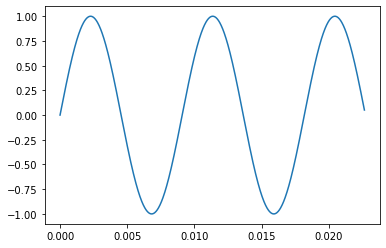

In [143]:
# Start with a base frequency of 110Hz - This matches with concert tuning as A2
first_harmonic = make_wave(110)
plt.plot(t[:1000], first_harmonic[:1000])
plt.show()
Audio(first_harmonic, rate=sampleRate)

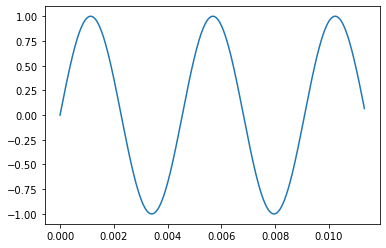

In [144]:
second_harmonic = make_wave(220) # The second harmonic is half the string length
plt.plot(t[:500], second_harmonic[:500])
plt.show()
Audio(second_harmonic, rate=sampleRate)

In [145]:
third_harmonic = make_wave(330) # Then half again
Audio(third_harmonic, rate=sampleRate)

In [146]:
fourth_harmonic = make_wave(440) # etc
Audio(fourth_harmonic, rate=sampleRate)

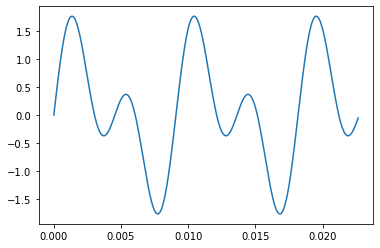

In [147]:
# Octave the ratio of the first harmonic frequency to the second is 2:1
# this is known as an octave
octave = first_harmonic + second_harmonic
plt.plot(t[:1000], octave[:1000])
plt.show()
Audio(octave, rate=sampleRate)

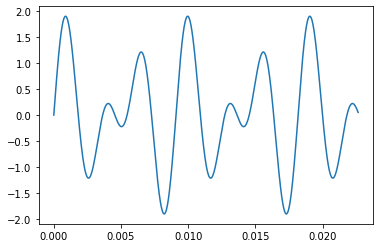

In [148]:
perfect_fifth = second_harmonic + third_harmonic # 3:2 
plt.plot(t[:1000], perfect_fifth[:1000])
plt.show()
Audio(perfect_fifth, rate=sampleRate)

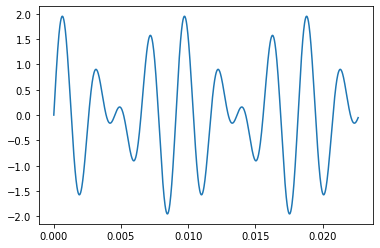

In [149]:
perfect_fourth = third_harmonic + fourth_harmonic # 4:3 Last perfect interval...
plt.plot(t[:1000], perfect_fourth[:1000])
plt.show()
Audio(perfect_fourth, rate=sampleRate)

In [150]:
fifth_harmonic = make_wave(550) # Then half again
Audio(fifth_harmonic, rate=sampleRate)

In [151]:
sixth_harmonic = make_wave(660) # Then half again
Audio(sixth_harmonic, rate=sampleRate)

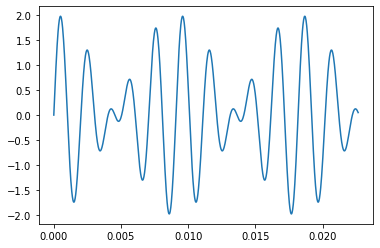

In [152]:
major_third = fourth_harmonic + fifth_harmonic # 5:4
plt.plot(t[:1000], major_third[:1000])
plt.show()
Audio(major_third, rate=sampleRate)

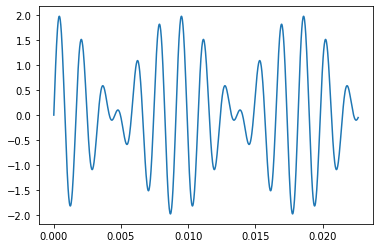

In [153]:
minor_third = fifth_harmonic + sixth_harmonic # 6:5
plt.plot(t[:1000], minor_third[:1000])
plt.show()
Audio(minor_third, rate=sampleRate)

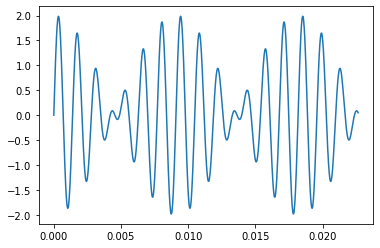

In [154]:
seventh_harmonic = make_wave(770)
subminor_third = sixth_harmonic + seventh_harmonic # 7:6 This is getting into the weird corners of music theory
plt.plot(t[:1000], subminor_third[:1000])
plt.show()
Audio(subminor_third, rate=sampleRate)

In [155]:
# Bringing all these into a single octave
a4 = 440 # Start with A4 - 440Hz
a_tonic = make_wave(a4) # 1:1 A 0-semitones
Audio(a_tonic, rate=sampleRate)

In [156]:
a_minor_third = make_wave(a4 * (6/5)) # 6:5 C 3-semitones
Audio(a_minor_third, rate=sampleRate)

In [157]:
a_major_third = make_wave(a4 * (5/4)) # 5:4 C# 4-semitones
Audio(a_major_third, rate=sampleRate)

In [158]:
a_perfect_fourth = make_wave(a4 * (4/3)) # 4:3 D 5-semitones
Audio(a_perfect_fourth, rate=sampleRate)

In [159]:
a_perfect_fifth = make_wave(a4 * (3/2)) # 3:2 E 7-semitones
Audio(a_perfect_fifth, rate=sampleRate)

In [160]:
a_octave = make_wave(a4 * (2/1)) # 2:1 A 12-semitones
Audio(a_octave, rate=sampleRate)

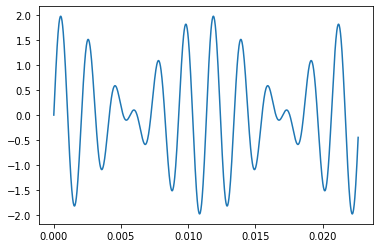

In [161]:
a_minor_third_interval = a_tonic + a_minor_third
plt.plot(t[:1000], a_minor_third_interval[:1000])
plt.show()
Audio(a_minor_third_interval, rate=sampleRate)

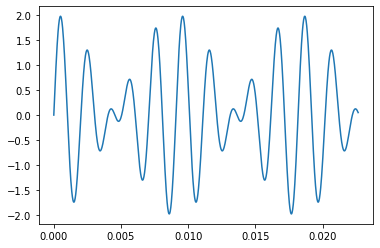

In [162]:
a_major_third_interval = a_tonic + a_major_third
plt.plot(t[:1000], a_major_third_interval[:1000])
plt.show()
Audio(a_major_third_interval, rate=sampleRate)

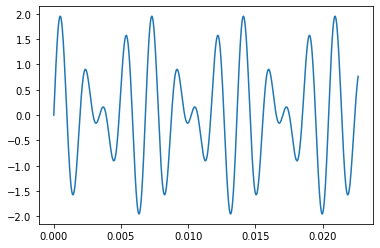

In [163]:
a_perfect_fourth_interval = a_tonic + a_perfect_fourth
plt.plot(t[:1000], a_perfect_fourth_interval[:1000])
plt.show()
Audio(a_perfect_fourth_interval, rate=sampleRate)

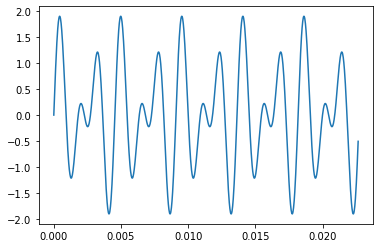

In [164]:
a_perfect_fifth_interval = a_tonic + a_perfect_fifth
plt.plot(t[:1000], a_perfect_fifth_interval[:1000])
plt.show()
Audio(a_perfect_fifth_interval, rate=sampleRate)

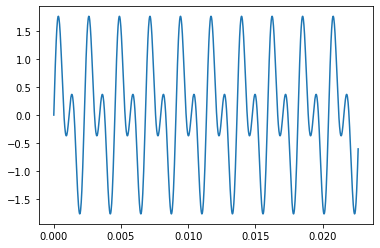

In [165]:
a_octave_interval = a_tonic + a_octave
plt.plot(t[:1000], a_octave_interval[:1000])
plt.show()
Audio(a_octave_interval, rate=sampleRate)

In [166]:
# Perfect 5ths and Perfect 4ths are opposite
# E - A is a perfect 4th
# A - E is a perfect 5th
# intervals are multiplicative so
# p4 * p5 = (4:3) * (3:2) = (12:6) = (2:1)
# so a perfect fourth then a perfect 5th is an octave
# 440 * 4:3 * 3:2 = 880

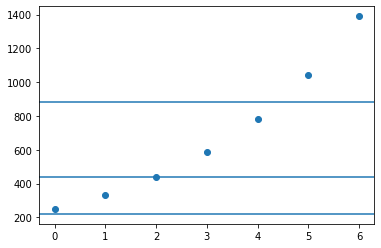

In [198]:
# The consonance of perfect 4ths is what scales are built around.
# So if we start with A
tonic_freq = 440
# A - D is a perfect fourth and D - G is a perfect fourth
# because our musical alphabet goes A,B,C,D,E,F,G and I want this to make sense
# D is the center of the scale we look at 3 perfect fourths above and 3 perfect
# fourths below (including the tonic)
# We can then look at perfect fourths in ascending order
freqs = [tonic_freq]
freq = tonic_freq
for _ in range(4): # Let's grab 4 above D (the center), G, C, F
    freq = freq * (4/3)
    freqs.append(freq)

freq = tonic_freq
for _ in range(2): # And 2 below E, B
    freq = freq * (3/4)
    freqs.append(freq)

num = tonic_freq/2
highest = max(freqs)
# Add a line at each octave
while(num < highest):
    plt.axhline(y=num)
    num *= 2
# We should now have a set of frequencies ranging accross octaves
freqs.sort()
plt.scatter(range(len(freqs)), freqs)
plt.show()

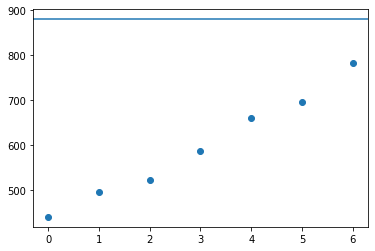

In [208]:
# To create a scale we want to stuff these all into a single octave
# Here is where we add in some fancy maths
# Thanks to Euler everyones favorite mathematician
# we know that log2(interval) = the number of octaves between the two frequencies
# a simple example log2(880/440) = log2(2) = 1 440 880 and 440 are 1 octave apart
# log2(880/110) = log2(8) = 3 880 and 110 are 3 octaves apart

normalized_freqs = []
for f in freqs:
    # Using this we can look at the ration between the frequency and the tonic
    r = f / tonic_freq
    distance = np.log2(r)
    if distance <= 1 and distance > 0: # If it is within an octave no need to transform it
        normalized_freqs.append(f)
        continue
    partial = np.modf(distance)[0] # If we have a distance of 2.6 octaves we only care about the 0.6 part
    if partial < 0:
        partial += 1 
        # d = -.3 we want to use +.7 (It is -.3 lower than than the tonic 
        # or .7 higher than the previous octave)
    normalized_r = 2**partial # Putting 2 to the power of distance will give us a ratio
    # d = log2(r) -> 2**d = 2**log2(r) = r
    norm_freq = tonic_freq * normalized_r
    normalized_freqs.append(norm_freq)

normalized_freqs.sort()
plt.axhline(y=tonic_freq * 2)
plt.scatter(range(len(normalized_freqs)), normalized_freqs)
plt.show()
# Now our notes nicely fit into a line

In [209]:
def make_audio(f):
    return Audio(make_wave(f), rate=sampleRate)

In [210]:
make_audio(normalized_freqs[0]) # A

In [211]:
make_audio(normalized_freqs[1]) # B

In [212]:
make_audio(normalized_freqs[2]) # C

In [213]:
make_audio(normalized_freqs[3]) # D

In [214]:
make_audio(normalized_freqs[4]) # E

In [215]:
make_audio(normalized_freqs[5]) # F

In [216]:
make_audio(normalized_freqs[6]) # G

In [217]:
# And there you have it the Aeolian mode
# better known as a natural minor scale 
# and since I know you are begging for resolution here is the tonic :)
make_audio(tonic_freq*2) # A

In [218]:
# Major scales are just the natural minor re-ordered hence relative minors
# other harmonic, and melodic minors are derived as well by raising and lowering certain scale degrees for effect.
# Note this example is using justified tuning where everything is based on perfect intervals
# With the advent of electric tuners a lot of instruments use equal temperment tuning where these notes are forced
# into equal subdivisions of the octave